In [3]:
import numpy as np 
import pandas as pd
import os
import time
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.express as px
os.chdir("/Users/pavelfilippov/Downloads/")

In [4]:
train = pd.read_csv("train-3.csv")

In [5]:
train.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [6]:
train.info

<bound method DataFrame.info of        label  pixel0  pixel1  pixel2  pixel3  pixel4  pixel5  pixel6  pixel7  \
0          1       0       0       0       0       0       0       0       0   
1          0       0       0       0       0       0       0       0       0   
2          1       0       0       0       0       0       0       0       0   
3          4       0       0       0       0       0       0       0       0   
4          0       0       0       0       0       0       0       0       0   
...      ...     ...     ...     ...     ...     ...     ...     ...     ...   
41995      0       0       0       0       0       0       0       0       0   
41996      1       0       0       0       0       0       0       0       0   
41997      7       0       0       0       0       0       0       0       0   
41998      6       0       0       0       0       0       0       0       0   
41999      9       0       0       0       0       0       0       0       0   

       

In [7]:
train.shape

(42000, 785)

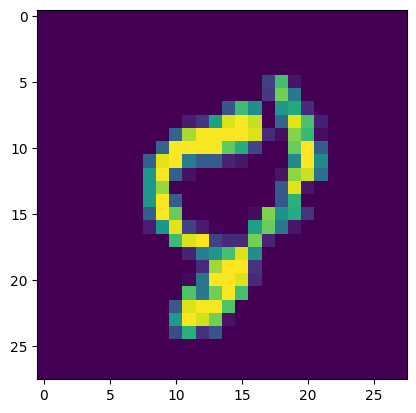

In [8]:
plt.imshow(train.iloc[18313,1:].values.reshape(28,28))

In [9]:
X=train.iloc[:,1:]
y=train.iloc[:,0]

In [10]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [11]:
X_train.shape

(33600, 784)

In [12]:
knn=KNeighborsClassifier()

In [13]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [14]:
start=time.time()
y_pred=knn.predict(X_test)
print(time.time()-start)

20.29254388809204


In [15]:
accuracy_score(y_test,y_pred)

0.9648809523809524

In [16]:
scaler=StandardScaler()
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)

In [17]:
pca=PCA(n_components=100)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)
X_train_trf.shape

(33600, 100)

In [18]:
knn=KNeighborsClassifier()
knn.fit(X_train_trf,y_train)

KNeighborsClassifier()

In [19]:
start=time.time()
y_pred=knn.predict(X_test_trf)
print(time.time()-start)

1.5712342262268066


In [20]:
pca=PCA(n_components=2)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)
X_train_trf

array([[-2.71866896, -0.48982099],
       [-0.67701751, -6.75345874],
       [-3.03326915,  6.50983134],
       ...,
       [ 2.14888919,  0.78080746],
       [ 1.05956758,  0.94762999],
       [17.70266607,  1.96175972]])

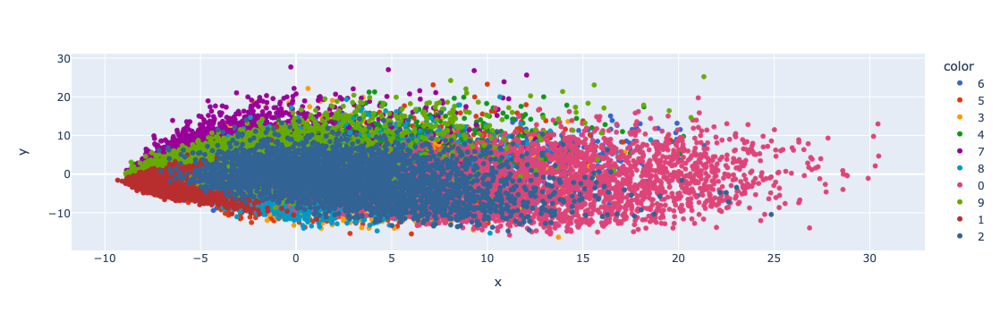

In [21]:
y_train_trf=y_train.astype(str)
fig=px.scatter(x=X_train_trf[:,0],
               y=X_train_trf[:,1],
               color=y_train_trf,
               color_discrete_sequence=px.colors.qualitative.G10
              )
fig.show()

In [22]:
pca=PCA(n_components=3)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)
X_train_trf

array([[-2.71866463, -0.4902711 ,  1.13519956],
       [-0.67702412, -6.75434203, -2.33623142],
       [-3.03327272,  6.50954257,  7.49151327],
       ...,
       [ 2.14894586,  0.78229451, -0.74648511],
       [ 1.05956717,  0.94741692,  3.94962056],
       [17.70258626,  1.96128281, -4.94401048]])

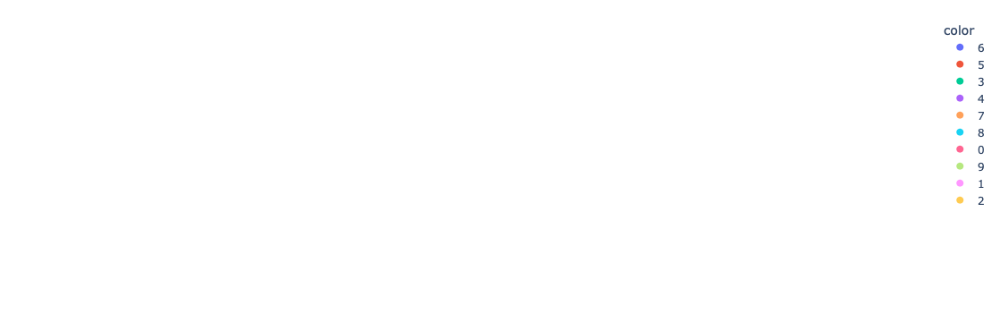

In [23]:
y_train_trf=y_train.astype(str)
fig=px.scatter_3d(train,x=X_train_trf[:,0],y=X_train_trf[:,1],z=X_train_trf[:,2],
                 color=y_train_trf)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20)
)
fig.show()

In [24]:
pca.explained_variance_

array([40.67111197, 29.1702336 , 26.74459599])

In [25]:
pca.components_

array([[ 8.59404045e-18,  2.19099698e-18,  1.49170523e-20, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [ 5.44489301e-17,  1.74866869e-17,  2.08463442e-19, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-9.34688270e-17, -2.35357118e-17, -5.78799741e-18, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

In [26]:
pca.components_.shape

(3, 784)

In [27]:
pca.explained_variance_ratio_

array([0.05785192, 0.0414927 , 0.03804239])

In [28]:
pca=PCA(n_components=None)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)
np.cumsum(pca.explained_variance_ratio_)

array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296

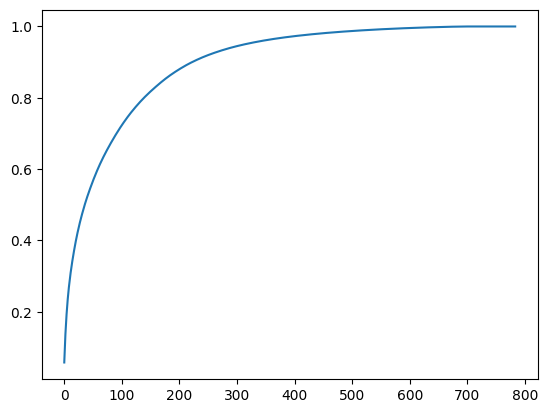

In [29]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))